**Amplitude Single Sideband Modulation with Audio Signal + Demodulation**

*NB: Play with delta_f for alien voice effect!*

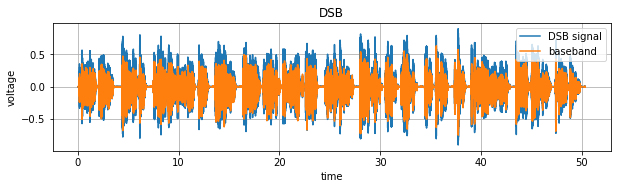

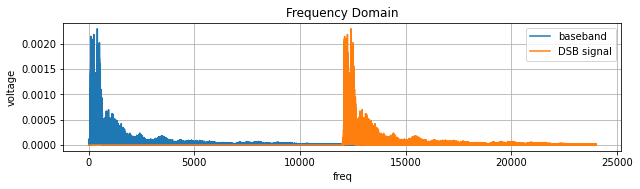

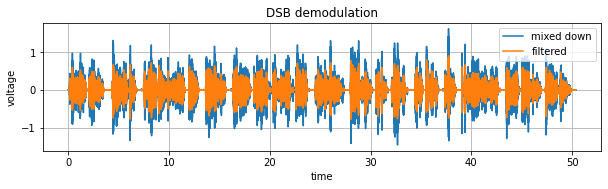

Original Signal


Demodulated Signal


In [2]:
import numpy as np
from scipy.signal import hilbert
import scipy.signal as sp
import scipy.signal as signal
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from IPython.display import Audio

plt.rcParams['legend.loc'] = 'upper right' # speed up plotting for large amount of data

# Read the WAV file: baseband
input_filename = "sample_audio.wav"
fs, uaudio = read(input_filename)

Ts = 1 / fs  # time step
Tmax = len(uaudio)/fs
t = np.arange(0, Tmax, Ts)  # time vector start / step / end

scale = (2**16)/2-1 # 16 bit resolution
uaudio_scaled = uaudio/scale

# carrier
fc = 12000
uc = np.cos(2 * np.pi * fc * t)

# SSB Generation (Phase Method)
# + LSB, - USB
ussb = uaudio_scaled * uc  - np.imag(hilbert(uaudio_scaled)) * np.imag(hilbert(uc))

 
# Plot Time Domain
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 1)  # 2 rows, 1 column, 1st row
plt.plot(t, np.real(ussb), t, np.real(uaudio_scaled))
plt.grid(True)
plt.title('DSB')
plt.xlabel('time')
plt.ylabel('voltage')
plt.legend(['DSB signal', 'baseband'])

# Calculate Spectra
n = len(uaudio_scaled)  # number of samples
f = np.arange(0, n)*(fs/n)  # vector of frequencies

F_audio = np.fft.fft(uaudio_scaled) # fourier coefficient (= amplitude) at each frequency
V_audio = 2/n * np.abs(F_audio) # absolute value of amplitude

F_ssb = np.fft.fft(ussb) 
V_ssb = 2/n * np.abs(F_ssb)

# Plot Frequency domain
F = np.fft.fft(uaudio_scaled)
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 2)  
plt.plot(f[:n//2], V_audio[:n//2], f[:n//2], V_ssb[:n//2])
plt.grid(True)
plt.title('Frequency Domain')
plt.xlabel('freq')
plt.ylabel('voltage')
plt.legend(['baseband', 'DSB signal'])


# Demodulation
# Down mixing
delta_f = -0.03 # Local Oscillator Offset, play with this value
ulocal = np.sin(2 * np.pi * fc * (1 + delta_f) * t)
# + USB, - LSB
udownmix = ussb * ulocal + np.imag(hilbert(ussb * np.imag(hilbert(ulocal))))

# Low pass filter
fc = 5000   # Cutoff frequency in Hz
order = 5   # Filter order

# Design Butterworth low-pass filter
b, a = signal.butter(order, fc / (fs / 2), btype='low', analog=False)
# Apply the filter
ub = signal.filtfilt(b, a, udownmix)


# Plot Time Domain
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 3) 
plt.plot(t, np.real(udownmix), t, np.real(ub))
plt.grid(True)
plt.title('DSB demodulation')
plt.xlabel('time')
plt.ylabel('voltage')
plt.legend(['mixed down', 'filtered'])

plt.show()


# Play original audio
audio1 = Audio(data=uaudio_scaled, rate=fs)
# Play demodulated audio
audio2 = Audio(data=ub, rate=fs)

print("Original Signal")
display(audio1)
print("Demodulated Signal")
display(audio2)

